In [2]:
import os
import numpy as np
import torch
import torch.nn as nn
from torcheval.metrics import BinaryAUROC

from torch import Tensor
from jaxtyping import Float, Int

import plotly.express as px
import plotly.figure_factory as ff
import matplotlib.pyplot as plt
from scipy.stats import skew

from analysis import get_autoencoder_directions, plot_board, show_top_activating

device = "mps" if torch.backends.mps.is_available() else "cpu"

In [ ]:
target_feature = 395
target_pos = 43

activations_location = "analysis_results/all_activations.pkl"
legal_moves_location = "analysis_results/all_legal_moves_me.pkl"
boards_location = "analysis_results/all_boards.pkl"

with open(activations_location, "rb") as f:
    all_activations = torch.load(f).detach()
with open(legal_moves_location, "rb") as f:
    all_legal_moves = torch.load(f).detach()
with open(boards_location, "rb") as f:
    all_boards = torch.load(f).detach()

In [62]:
def get_probe_directions(
    probe_location="probes/probe_layer_6.pkl", normalized=True
) -> Float[Tensor, "pos cls d_model"]:
    with open(probe_location, "rb") as f:
        probe = torch.load(f, map_location=device)

    original_probe_directions = torch.stack([x.weight for x in probe.classifier], dim=1)
    if normalized:
        probe_directions: Float[Tensor, "pos cls d_model"] = (
            original_probe_directions
            / original_probe_directions.norm(dim=-1, keepdim=True)
        )
        return probe_directions
    return original_probe_directions


def get_probe_activations(
    act_location="analysis_results/probe_activations.pkl",
) -> Float[Tensor, "n_board pos cls"]:
    with open(act_location, "rb") as f:
        probe_activations = torch.load(f)
    return probe_activations


def get_probe_boards(
    board_location="analysis_results/probe_all_boards.pkl",
) -> Float[Tensor, "n_board pos"]:
    with open(board_location, "rb") as f:
        probe_boards = torch.load(f)
    return probe_boards


def pos_string2int(pos_name: str) -> Int:
    """Example: A1 -> 0, F6 -> 45, H8 -> 63"""
    assert len(pos_name) == 2, "pos_name must be a string of length 2"
    letter, number = pos_name
    return (ord(letter) - ord("A")) + (int(number) - 1) * 8

def pos_int2string(pos_int: Int) -> str:
    """Example: 0 -> A1, 45 -> F6, 63 -> H8"""
    assert 0 <= pos_int < 64, "pos_int must be an int between 0 and 63"
    letter = chr(ord("A") + pos_int % 8)
    number = (pos_int // 8) + 1
    return f"{letter}{number}"

def get_probe_direction(
    board_position, primary_class, normalized=False
) -> Float[Tensor, "d_model"]:
    """get one probe direction for a given board position and primary class"""

    # convert string to int
    if isinstance(board_position, str):
        board_position = pos_string2int(board_position)
        assert (
            0 <= board_position < 64
        ), "Invalid board position input. Example: 'A1', 'F6'"
    elif isinstance(board_position, int):
        assert (
            0 <= board_position < 64
        ), "board_position must be an int between 0 and 63"
    else:
        raise ValueError("board_position must be a string or an int")

    # convert primary class to int
    if isinstance(primary_class, str):
        assert primary_class in [
            "Empty",
            "Own",
            "Enemy",
        ], "primary_class must be one of 'Empty', 'Own', 'Enemy'"
        primary_class = {"Empty": 0, "Own": 1, "Enemy": 2}[primary_class]
    elif isinstance(primary_class, int):
        assert primary_class in [0, 1, 2], "primary_class must be one of 0, 1, 2"
    else:
        raise ValueError("primary_class must be a string or an int")

    # check global variable for probe directions
    if normalized:
        if "probe_directions_normalized" not in globals():
            global probe_directions_normalized
            probe_directions_normalized = get_probe_directions(normalized=normalized)
        return probe_directions_normalized[board_position, primary_class]

    if "probe_directions" not in globals():
        global probe_directions
        probe_directions = get_probe_directions(normalized=normalized)
    return probe_directions[board_position, primary_class]


def show_top_activating_for_probe(
    probe_number_64,
    probe_number_3,
    top_k=5,
    marked_position=-1,
    directory="analysis_results",
):
    with open("analysis_results/probe_activations.pkl", "rb") as f:
        all_activations = torch.load(f)
    with open("analysis_results/probe_all_boards.pkl", "rb") as f:
        all_boards = torch.load(f)
    num_data = all_boards.shape[0]
    filtered_boards = all_boards[torch.where(all_boards[:, 0] > -100)]
    these_activations = all_activations[:, probe_number_64, probe_number_3]
    filtered_activations = these_activations[torch.where(all_boards[:, 0] > -100)]
    best_activations, best_indices = torch.topk(filtered_activations, k=top_k)
    random_indices = torch.randint(low=0, high=num_data, size=(top_k,))
    best_boards = filtered_boards[best_indices]
    # best_activations=sorted_activations[best_indices]
    random_boards = filtered_boards[random_indices]
    random_activations = filtered_activations[random_indices]
    class_names = {0: "Empty", 1: "Own", 2: "Enemy"}

    fig, axs = plt.subplots(2, top_k, figsize=(10, 5))
    plt.suptitle(
        f"Top Activating Boards and Random Boards for Probe {probe_number_64}-{class_names[probe_number_3]}, with Position {marked_position} marked"
    )

    for n in range(top_k):
        # Plot on the specified axes in the grid
        plot_board(
            axs[0, n],
            best_boards[n],
            best_activations[n],
            marked_position=marked_position,
        )
        plot_board(
            axs[1, n],
            random_boards[n],
            random_activations[n],
            marked_position=marked_position,
        )

    plt.show()
    plt.close(fig)  # Close the specific figure to release memory

In [ ]:
probe_directions_normalized: Float[Tensor, "pos cls d_model"] = get_probe_directions()
probe_directions: Float[Tensor, "pos cls d_model"] = get_probe_directions(
    normalized=False
)

probe_activations: Float[Tensor, "n_board pos cls"] = get_probe_activations()
probe_boards: Float[Tensor, "n_board pos"] = get_probe_boards()

sae_directions: Float[Tensor, "n_sae d_model"] = get_autoencoder_directions()

In [ ]:
# potential rules:
# D6 Empty
# E6 Enemy
# F6 Own

sae_target = sae_directions[target_feature]

D6_Empty = get_probe_direction("D6", "Empty", normalized=False)

E6_Empty = get_probe_direction("E6", "Empty", normalized=False)
E6_Enemy = get_probe_direction("E6", "Enemy", normalized=False)
E6_Own = get_probe_direction("E6", "Own", normalized=False)

F6_Empty = get_probe_direction("F6", "Empty", normalized=False)
F6_Enemy = get_probe_direction("F6", "Enemy", normalized=False)
F6_Own = get_probe_direction("F6", "Own", normalized=False)


cos = nn.CosineSimilarity(dim=0, eps=1e-6)
cos(sae_target, D6_Empty), cos(sae_target, E6_Enemy - E6_Own), cos(
    sae_target, F6_Own - F6_Enemy
)
# cos(sae_target, D6_Empty), cos(sae_target, E6_Enemy), cos(sae_target, F6_Own)

# cos(D6_Empty, E6_Enemy), cos(D6_Empty, F6_Own), cos(E6_Enemy, F6_Own)

In [ ]:
# px.histogram(sae_target.detach().cpu().numpy(), nbins=100)

In [ ]:
show_top_activating(
    feature_number=target_feature, top_k=5, top_n=500, marked_position=43
)  # note: enemy pieces are white

In [63]:
def gen_pattern(
    empty: list[str] = ["D6"],
    enemy: list[str] = ["E6"],
    own: list[str] = ["F6"],
):
    """
    generate a pattern for a given board position
    """
    # initialize the board to -1
    pattern = torch.full((64,), -1)
    for pos in empty:
        pattern[pos_string2int(pos)] = 0
    for pos in own:
        pattern[pos_string2int(pos)] = 1
    for pos in enemy:
        pattern[pos_string2int(pos)] = 2
    return pattern


pattern1 = gen_pattern()
# Empty D6, Enemy: D5, Own: D4
pattern2 = gen_pattern(empty=["D6"], enemy=["D5"], own=["D4"])
pattern3 = gen_pattern(empty=["D6"], enemy=["D5", "D4"], own=["D3"])
pattern4 = gen_pattern(empty=["D6"], enemy=["E5"], own=["F4"])


# gen pattern by string
def gen_pattern_by_string(
    based_token: str = "D6",
    direction: str = "right",
    num_of_enemy: int = 1,
):
    """
    generate a pattern for a given board position
    """
    # initialize the board to -1
    assert direction in [
        "right",
        "left",
        "up",
        "down",
        "up_right",
        "up_left",
        "down_right",
        "down_left",
    ], "Invalid direction"

    # get the board to 2-dimensional
    based_token = pos_string2int(based_token)
    r, c = based_token // 8, based_token % 8

    board = torch.full((8, 8), -1)

    # add the empty piece
    board[r, c] = 0

    dir_vector = {
        "right": (0, 1),
        "left": (0, -1),
        "up": (-1, 0),
        "down": (1, 0),
        "up_right": (-1, 1),
        "up_left": (-1, -1),
        "down_right": (1, 1),
        "down_left": (1, -1),
    }[direction]

    # add the enemy and own pieces
    for i in range(num_of_enemy + 1):
        r += dir_vector[0]
        c += dir_vector[1]

        # check if the position is out of the board
        if r < 0 or r >= 8 or c < 0 or c >= 8:
            return None

        if i < num_of_enemy:
            # add the enemy piece
            board[r, c] = 2
        else:
            # add the own piece
            board[r, c] = 1

    return board.flatten()


# gen_pattern_by_string("D6", "up", 2)

directions = [
    "right",
    "left",
    "up",
    "down",
    "up_right",
    "up_left",
    "down_right",
    "down_left",
]
patterns_dict = {}

for direction in directions:
    for num_of_enemy in range(1, 8):
        pattern = gen_pattern_by_string("D6", direction, num_of_enemy)
        if pattern is None:
            break

        patterns_dict[f"{direction}_{num_of_enemy}"] = pattern


print(len(patterns_dict))
for key, pattern in patterns_dict.items():
    print(key)

17
right_1
right_2
right_3
left_1
left_2
up_1
up_2
up_3
up_4
down_1
up_right_1
up_right_2
up_right_3
up_left_1
up_left_2
down_right_1
down_left_1


In [69]:
# test whether the activation is high for the legal move. draw distribution of activations for legal and illegal moves

def plot_distribution_of_activations_legal(
    feature_number,
    target_position,
    activations_location="analysis_results/all_activations.pkl",
    legal_moves_location="analysis_results/all_legal_moves_me.pkl",
):
    with open(activations_location, "rb") as f:
        all_activations = torch.load(f)
    with open(legal_moves_location, "rb") as f:
        all_legal_moves = torch.load(f)

    feature_activation: Float[Tensor, "n_board"] = all_activations[:, feature_number]
    board_position: Float[Tensor, "n_board"] = all_legal_moves[:, target_position]

    legal_activations = feature_activation[board_position == 1]
    illegal_activations = feature_activation[board_position == 0]

    # ignore activations < 1
    legal_activations = legal_activations[legal_activations > 1]
    illegal_activations = illegal_activations[illegal_activations > 1]

    # make it to numpy
    legal_activations = legal_activations.detach().numpy()
    illegal_activations = illegal_activations.detach().numpy()

    # show probability density
    fig = ff.create_distplot(
        hist_data=[legal_activations, illegal_activations],
        group_labels=["Legal", "Illegal"],
        bin_size=1,
    )

    fig.update_layout(
        title=f"Activation distribution of feature {feature_number} at position {target_position}"
    )
    fig.show()


def plot_distribution_of_activations_types(
    feature_number,
    target_position,
    activations_location="analysis_results/all_activations.pkl",
    boards_location="analysis_results/all_boards.pkl",
):
    with open(activations_location, "rb") as f:
        all_activations = torch.load(f)
    with open(boards_location, "rb") as f:
        all_boards = torch.load(f)

    feature_activation: Float[Tensor, "n_board"] = all_activations[:, feature_number]
    board_position: Float[Tensor, "n_board"] = all_boards[:, target_position]

    empty_activations = feature_activation[board_position == 0]
    own_activations = feature_activation[board_position == 1]
    enemy_activations = feature_activation[board_position == 2]

    # ignore activations < 1
    empty_activations = empty_activations[empty_activations > 1]
    own_activations = own_activations[own_activations > 1]
    enemy_activations = enemy_activations[enemy_activations > 1]

    # make it to numpy
    empty_activations = empty_activations.detach().numpy()
    own_activations = own_activations.detach().numpy()
    enemy_activations = enemy_activations.detach().numpy()

    # show probability density
    fig = ff.create_distplot(
        hist_data=[empty_activations, own_activations, enemy_activations],
        group_labels=["Empty", "Own", "Enemy"],
        bin_size=1,
    )

    fig.update_layout(
        title=f"Activation distribution of feature {feature_number} at position {target_position}"
    )
    fig.show()


def plot_distribution_of_activations_empty_legal(
    feature_number,
    target_position,
    activations_location="analysis_results/all_activations.pkl",
    legal_moves_location="analysis_results/all_legal_moves_me.pkl",
    boards_location="analysis_results/all_boards.pkl",
    ignore_zero=False,
):
    """
    show distribution of "empty + legal" and "empty + illegal" activations
    """
    with open(activations_location, "rb") as f:
        all_activations = torch.load(f)
    with open(legal_moves_location, "rb") as f:
        all_legal_moves = torch.load(f)
    with open(boards_location, "rb") as f:
        all_boards = torch.load(f)

    feature_activation: Float[Tensor, "n_board"] = all_activations[:, feature_number]
    board_position: Float[Tensor, "n_board"] = all_boards[:, target_position]

    legal_activations = feature_activation[
        (board_position == 0) & (all_legal_moves[:, target_position] == 1)
    ]
    illegal_activations = feature_activation[
        (board_position == 0) & (all_legal_moves[:, target_position] == 0)
    ]

    if ignore_zero:
        legal_activations = legal_activations[legal_activations > 0]
        illegal_activations = illegal_activations[illegal_activations > 0]
    # legal_activations = legal_activations[legal_activations > 1]
    # illegal_activations = illegal_activations[illegal_activations > 1]

    # make it to numpy
    legal_activations = legal_activations.detach().numpy()
    illegal_activations = illegal_activations.detach().numpy()

    # global legal_calc_AUROC
    # global illegal_calc_AUROC

    # legal_calc_AUROC = legal_activations
    # illegal_calc_AUROC = illegal_activations
    # print kl-divergence of the two distributions

    # show probability density
    fig = ff.create_distplot(
        hist_data=[legal_activations, illegal_activations],
        group_labels=["Empty + Legal", "Empty + Illegal"],
        bin_size=1,
    )
    fig.update_layout(
        title=f"Activation distribution of feature {feature_number} at position {target_position}",
        width=800,
        height=400,
        
    )
    fig.show()


legal_calc_AUROC = None
illegal_calc_AUROC = None


def plot_distribution_of_activations_odd_even_empty_legal(
    feature_number,
    target_position,
    activations_location="analysis_results/all_activations.pkl",
    legal_moves_location="analysis_results/all_legal_moves_me.pkl",
    boards_location="analysis_results/all_boards.pkl",
):
    """
    show distribution of "empty + legal" and "empty + illegal" activations
    """
    with open(activations_location, "rb") as f:
        all_activations = torch.load(f)
    with open(legal_moves_location, "rb") as f:
        all_legal_moves = torch.load(f)
    with open(boards_location, "rb") as f:
        all_boards = torch.load(f)

    feature_activation: Float[Tensor, "n_board"] = all_activations[:, feature_number]
    board_position: Float[Tensor, "n_board"] = all_boards[:, target_position]

    # calc sum of moves, odd or even.
    # filter board value 2, change to 1
    total_moves = all_boards.clone()
    total_moves[total_moves == 2] = 1
    total_moves = torch.sum(total_moves, dim=-1)
    even_moves = total_moves % 2 == 0

    legal_odd_activations = feature_activation[
        (board_position == 0)
        & (all_legal_moves[:, target_position] == 1)
        & (even_moves == 0)
    ]
    legal_even_activations = feature_activation[
        (board_position == 0)
        & (all_legal_moves[:, target_position] == 1)
        & (even_moves == 1)
    ]
    illegal_odd_activations = feature_activation[
        (board_position == 0)
        & (all_legal_moves[:, target_position] == 0)
        & (even_moves == 0)
    ]
    illegal_even_activations = feature_activation[
        (board_position == 0)
        & (all_legal_moves[:, target_position] == 0)
        & (even_moves == 1)
    ]

    # # ignore activations < 1
    # legal_activations = legal_activations[legal_activations > 1]
    # illegal_activations = illegal_activations[illegal_activations > 1]

    # make it to numpy
    legal_odd_activations = legal_odd_activations.detach().numpy()
    legal_even_activations = legal_even_activations.detach().numpy()
    illegal_odd_activations = illegal_odd_activations.detach().numpy()
    illegal_even_activations = illegal_even_activations.detach().numpy()

    print("each group size:")
    print(
        len(legal_odd_activations),
        len(legal_even_activations),
        len(illegal_odd_activations),
        len(illegal_even_activations),
    )

    # show probability density
    fig = ff.create_distplot(
        hist_data=[
            legal_odd_activations,
            legal_even_activations,
            illegal_odd_activations,
            illegal_even_activations,
        ],
        group_labels=[
            "Empty + Legal + Odd",
            "Empty + Legal + Even",
            "Empty + Illegal + Odd",
            "Empty + Illegal + Even",
        ],
        bin_size=1,
    )
    fig.update_layout(
        title=f"Activation distribution of feature {feature_number} at position {target_position}"
    )
    fig.show()


def plot_distribution_of_activations_previous_legal(
    feature_number,
    target_position,
    activations_location="analysis_results/all_activations.pkl",
    legal_moves_location="analysis_results/all_legal_moves_me.pkl",
    boards_location="analysis_results/all_boards.pkl",
):
    """
    whether it is legal in previous move
    """
    with open(activations_location, "rb") as f:
        all_activations = torch.load(f)
    with open(legal_moves_location, "rb") as f:
        all_legal_moves = torch.load(f)
    with open(boards_location, "rb") as f:
        all_boards = torch.load(f)

    feature_activation: Float[Tensor, "n_board"] = all_activations[:, feature_number]
    board_position: Float[Tensor, "n_board"] = all_boards[:, target_position]

    # calc sum of moves, 9 - 60
    # filter board value 2, change to 1
    total_moves = all_boards.clone()
    total_moves[total_moves == 2] = 1
    total_moves = torch.sum(total_moves, dim=-1)

    # move legal in previous move
    legal_prev_moves = all_legal_moves[:, target_position].clone()  # shape: n_board
    legal_prev_moves = torch.cat((torch.tensor([0]), legal_prev_moves[:-1]))

    # if total_moves is 9, then legal_prev_moves is 0
    legal_prev_moves[total_moves == 9] = 0

    legal_previous_activations = feature_activation[
        (board_position == 0) & (legal_prev_moves == 1) & (total_moves > 9)
    ]
    illegal_previous_activations = feature_activation[
        (board_position == 0) & (legal_prev_moves == 0) & (total_moves > 9)
    ]

    # make it to numpy
    legal_previous_activations = legal_previous_activations.detach().numpy()
    illegal_previous_activations = illegal_previous_activations.detach().numpy()

    print("each group size:")
    print(len(legal_previous_activations), len(illegal_previous_activations))

    # show probability density
    fig = ff.create_distplot(
        hist_data=[legal_previous_activations, illegal_previous_activations],
        group_labels=["Empty + Legal + Previous", "Empty + Illegal + Previous"],
        bin_size=1,
    )

    fig.update_layout(
        title=f"Activation distribution of feature {feature_number} at position {target_position}"
    )
    fig.show()


def plot_distribution_of_activations_current_previous_legal(
    feature_number,
    target_position,
    activations_location="analysis_results/all_activations.pkl",
    legal_moves_location="analysis_results/all_legal_moves_me.pkl",
    boards_location="analysis_results/all_boards.pkl",
):
    """
    whether it is legal in previous move, and current move
    """
    with open(activations_location, "rb") as f:
        all_activations = torch.load(f)
    with open(legal_moves_location, "rb") as f:
        all_legal_moves = torch.load(f)
    with open(boards_location, "rb") as f:
        all_boards = torch.load(f)

    feature_activation: Float[Tensor, "n_board"] = all_activations[:, feature_number]
    board_position: Float[Tensor, "n_board"] = all_boards[:, target_position]

    # calc sum of moves, 9 - 60
    # filter board value 2, change to 1
    total_moves = all_boards.clone()
    total_moves[total_moves == 2] = 1
    total_moves = torch.sum(total_moves, dim=-1)

    # move legal in previous move
    legal_prev_moves = all_legal_moves[:, target_position].clone()  # shape: n_board
    legal_prev_moves = torch.cat((torch.tensor([0]), legal_prev_moves[:-1]))

    # instead of prev moves, get the next moves legal/illegal status
    # legal_prev_moves = torch.cat((legal_prev_moves[1:], torch.tensor([0])))

    # legal current move
    legal_curr_moves = all_legal_moves[:, target_position]

    # if total_moves is 9, then legal_prev_moves is 0
    legal_prev_moves[total_moves == 9] = 0

    legal_prev_legal_curr_act = feature_activation[
        (board_position == 0)
        & (legal_prev_moves == 1)
        & (legal_curr_moves == 1)
        & (total_moves > 9)
    ]
    illegal_prev_legal_curr_act = feature_activation[
        (board_position == 0)
        & (legal_prev_moves == 0)
        & (legal_curr_moves == 1)
        & (total_moves > 9)
    ]
    legal_prev_illegal_curr_act = feature_activation[
        (board_position == 0)
        & (legal_prev_moves == 1)
        & (legal_curr_moves == 0)
        & (total_moves > 9)
    ]
    illegal_prev_illegal_curr_act = feature_activation[
        (board_position == 0)
        & (legal_prev_moves == 0)
        & (legal_curr_moves == 0)
        & (total_moves > 9)
    ]

    # make it to numpy
    legal_prev_legal_curr_act = legal_prev_legal_curr_act.detach().numpy()
    illegal_prev_legal_curr_act = illegal_prev_legal_curr_act.detach().numpy()
    legal_prev_illegal_curr_act = legal_prev_illegal_curr_act.detach().numpy()
    illegal_prev_illegal_curr_act = illegal_prev_illegal_curr_act.detach().numpy()

    # calc skewness for each group
    print("skewness and group size:")
    print(
        f"legal_prev_legal_curr_act: {skew(legal_prev_legal_curr_act)}, {len(legal_prev_legal_curr_act)}"
    )
    print(
        f"illegal_prev_legal_curr_act: {skew(illegal_prev_legal_curr_act)}, {len(illegal_prev_legal_curr_act)}"
    )
    print(
        f"legal_prev_illegal_curr_act: {skew(legal_prev_illegal_curr_act)}, {len(legal_prev_illegal_curr_act)}"
    )
    print(
        f"illegal_prev_illegal_curr_act: {skew(illegal_prev_illegal_curr_act)}, {len(illegal_prev_illegal_curr_act)}"
    )

    # show probability density
    fig = ff.create_distplot(
        hist_data=[
            legal_prev_legal_curr_act,
            illegal_prev_legal_curr_act,
            legal_prev_illegal_curr_act,
            illegal_prev_illegal_curr_act,
        ],
        group_labels=[
            "Empty+PrevLegal+CurrLegal",
            "Empty+PrevIllegal+CurrLegal",
            "Empty+PrevLegal+CurrIllegal",
            "Empty+PrevIllegal+CurrIllegal",
        ],
        bin_size=1,
    )

    fig.update_layout(
        title=f"Activation distribution of feature {feature_number} at position {target_position}"
    )
    fig.show()


def plot_distribution_of_activations_pattern(
    feature_number,
    target_position,
    pattern=gen_pattern(),
    activations_location="analysis_results/all_activations.pkl",
    boards_location="analysis_results/all_boards.pkl",
    legal_moves_location="analysis_results/all_legal_moves_me.pkl",
):
    """
    show distribution of board containing/missing a pattern
    """
    with open(activations_location, "rb") as f:
        all_activations = torch.load(f)
    with open(boards_location, "rb") as f:
        all_boards = torch.load(f)
    with open(legal_moves_location, "rb") as f:
        all_legal_moves = torch.load(f)

    feature_activation: Float[Tensor, "n_board"] = all_activations[:, feature_number]
    board_position: Float[Tensor, "n_board"] = all_boards[:, target_position]
    legal_moves: Float[Tensor, "n_board"] = all_legal_moves[:, target_position]

    # filter board that contains the pattern, ignore -1. Only consider 0, 1, 2
    # the pattern is a shappe (64,) tensor, with -1 for any position that is not considered.
    # each board is a shape (64,) tensor, with 0, 1, 2 for empty, own, enemy
    relevant_positions = pattern != -1
    expanded_pattern = pattern[relevant_positions].unsqueeze(0)

    # Check for matches only at relevant positions
    matches = all_boards[:, relevant_positions] == expanded_pattern
    match_indices = matches.all(dim=1)

    matched_activations = feature_activation[(match_indices) & (board_position == 0)]
    unmatched_activations = feature_activation[(~match_indices) & (board_position == 0)]

    # make it to numpy
    matched_activations = matched_activations.detach().numpy()
    unmatched_activations = unmatched_activations.detach().numpy()

    print("each group size:")
    print(len(matched_activations), len(unmatched_activations))

    # show probability density
    fig = ff.create_distplot(
        hist_data=[matched_activations, unmatched_activations],
        group_labels=["Empty + Pattern Matched", "Empty + Pattern Unmatched"],
        bin_size=1,
    )

    fig.update_layout(
        title=f"Activation distribution of feature {feature_number} at position {target_position}"
    )
    fig.show()


def plot_distribution_of_activations_patterns(
    feature_number,
    target_position,
    patterns,
    activations_location="analysis_results/all_activations.pkl",
    boards_location="analysis_results/all_boards.pkl",
    legal_moves_location="analysis_results/all_legal_moves_me.pkl",
):
    """
    show distribution of board containing any patterns or not
    """
    with open(activations_location, "rb") as f:
        all_activations = torch.load(f)
    with open(boards_location, "rb") as f:
        all_boards = torch.load(f)
    with open(legal_moves_location, "rb") as f:
        all_legal_moves = torch.load(f)

    feature_activation: Float[Tensor, "n_board"] = all_activations[:, feature_number]
    board_position: Float[Tensor, "n_board"] = all_boards[:, target_position]
    legal_moves: Float[Tensor, "n_board"] = all_legal_moves[:, target_position]

    # filter board that contains the pattern, ignore -1. Only consider 0, 1, 2
    # the pattern is a shappe (64,) tensor, with -1 for any position that is not considered.
    # each board is a shape (64,) tensor, with 0, 1, 2 for empty, own, enemy
    # TODOOOOOOO
    #
    match_indices_each_pattern = torch.zeros(
        (len(patterns), all_boards.shape[0]), dtype=torch.bool
    )
    for pi, pattern in enumerate(patterns):
        relevant_positions = pattern != -1
        expanded_pattern = pattern[relevant_positions].unsqueeze(0)

        # Check for matches only at relevant positions
        matches = all_boards[:, relevant_positions] == expanded_pattern
        match_indices = matches.all(dim=1)
        match_indices_each_pattern[pi] = match_indices

    # union the match indices
    match_indices = match_indices_each_pattern.any(dim=0)

    matched_activations = feature_activation[(match_indices) & (board_position == 0)]
    unmatched_activations_illegal = feature_activation[
        (~match_indices) & (board_position == 0) & (legal_moves == 0)
    ]
    unmatched_activations_legal = feature_activation[
        (~match_indices) & (board_position == 0) & (legal_moves == 1)
    ]

    # make it to numpy
    matched_activations = matched_activations.detach().numpy()
    unmatched_activations_illegal = unmatched_activations_illegal.detach().numpy()
    unmatched_activations_legal = unmatched_activations_legal.detach().numpy()

    print("each group size:")
    print(
        f"{len(unmatched_activations_illegal)=}, {len(unmatched_activations_legal)=}, {len(matched_activations)=}"
    )

    # show probability density
    fig = ff.create_distplot(
        hist_data=[
            matched_activations,
            unmatched_activations_illegal,
            unmatched_activations_legal,
        ],
        group_labels=[
            "Empty + Pattern Matched (Legal)",
            "Empty + Pattern Unmatched (Illegal)",
            "Empty + Pattern Unmatched (Legal)",
        ],
        bin_size=1,
    )

    fig.update_layout(
        title=f"Activation distribution of feature {feature_number} at position {target_position}"
    )
    fig.show()


def plot_distribution_of_activations_pattern_legal(
    feature_number,
    target_position,
    pattern=gen_pattern(),
    pattern_name=None,
    activations_location="analysis_results/all_activations.pkl",
    boards_location="analysis_results/all_boards.pkl",
    legal_moves_location="analysis_results/all_legal_moves_me.pkl",
):
    """
    show distribution of board containing/missing a pattern
    """
    with open(activations_location, "rb") as f:
        all_activations = torch.load(f)
    with open(boards_location, "rb") as f:
        all_boards = torch.load(f)
    with open(legal_moves_location, "rb") as f:
        all_legal_moves = torch.load(f)

    feature_activation: Float[Tensor, "n_board"] = all_activations[:, feature_number]
    board_position: Float[Tensor, "n_board"] = all_boards[:, target_position]
    legal_moves: Float[Tensor, "n_board"] = all_legal_moves[:, target_position]

    # filter board that contains the pattern, ignore -1. Only consider 0, 1, 2
    # the pattern is a shappe (64,) tensor, with -1 for any position that is not considered.
    # each board is a shape (64,) tensor, with 0, 1, 2 for empty, own, enemy
    relevant_positions = pattern != -1
    expanded_pattern = pattern[relevant_positions].unsqueeze(0)

    # Check for matches only at relevant positions
    matches = all_boards[:, relevant_positions] == expanded_pattern
    match_indices = matches.all(dim=1)

    matched_activations = feature_activation[(match_indices) & (board_position == 0)]
    unmatched_activations_illegal = feature_activation[
        (~match_indices) & (board_position == 0) & (legal_moves == 0)
    ]
    unmatched_activations_legal = feature_activation[
        (~match_indices) & (board_position == 0) & (legal_moves == 1)
    ]

    # make it to numpy
    matched_activations = matched_activations.detach().numpy()
    unmatched_activations_illegal = unmatched_activations_illegal.detach().numpy()
    unmatched_activations_legal = unmatched_activations_legal.detach().numpy()

    print("each group size:")
    print(
        f"{len(unmatched_activations_illegal)=}, {len(unmatched_activations_legal)=}, {len(matched_activations)=}"
    )

    # show probability density
    fig = ff.create_distplot(
        hist_data=[
            matched_activations,
            unmatched_activations_illegal,
            unmatched_activations_legal,
        ],
        group_labels=[
            "Empty + Pattern Matched (Legal)",
            "Empty + Pattern Unmatched (Illegal)",
            "Empty + Pattern Unmatched (Legal)",
        ],
        bin_size=1,
    )

    fig.update_layout(
        title=f"Activation distribution of feature {feature_number} at position {target_position}, pattern: {pattern_name}"
    )
    fig.show()


# plot_distribution_of_activations_legal(target_feature, target_pos)
# plot_distribution_of_activations_types(target_feature, target_pos)
# plot_distribution_of_activations_empty_legal(target_feature, target_pos)
# plot_distribution_of_activations_empty_legal(353, 18)
# plot_distribution_of_activations_empty_legal(727, 37)
# plot_distribution_of_activations_empty_legal(722, 26)
# plot_distribution_of_activations_odd_even_empty_legal(target_feature, target_pos)
# plot_distribution_of_activations_previous_legal(target_feature, target_pos)
# plot_distribution_of_activations_current_previous_legal(target_feature, target_pos)
# plot_distribution_of_activations_pattern(target_feature, target_pos)
# plot_distribution_of_activations_pattern_legal(target_feature, target_pos, pattern=pattern1, pattern_name="pattern1")

# for pattern_name, pattern in patterns_dict.items():
#     plot_distribution_of_activations_pattern_legal(
#         target_feature, target_pos, pattern=pattern, pattern_name=pattern_name
#     )

# test different patterns
# plot_distribution_of_activations_pattern(target_feature, target_pos, pattern=pattern1)
# plot_distribution_of_activations_pattern(target_feature, target_pos, pattern=pattern2)
# plot_distribution_of_activations_pattern(target_feature, target_pos, pattern=pattern3)
# plot_distribution_of_activations_pattern(target_feature, target_pos, pattern=pattern4)

# plot_distribution_of_activations_patterns(target_feature, target_pos, patterns=[pattern1, pattern2, pattern3, pattern4])

In [ ]:
import numpy as np
import statsmodels.api as sm
import pandas as pd

positions = ['E6', 'F6', 'D5', 'D4', 'D3', 'E5', 'F4']
status = ['Enemy', 'Own'] # Empty as the base group
middle_four_pos = ['E5', 'E4', 'D5', 'D4']
pos_status_lst = [f'{pos}_{stat}' for pos in positions for stat in status if not (pos in middle_four_pos and stat == 'Own')]
print(pos_status_lst)

# first get boards and activations that D6 is empty
int_D6 = pos_string2int("D6")
boards_D6_empty = all_boards[all_boards[:, int_D6] == 0] # shape: (filtered_board 20420, 64)
these_activations = all_activations[:, target_feature]
activations_D6_empty = these_activations[all_boards[:, int_D6] == 0] # shape: (filtered_board 20420,)

# get status for each position
positions_status = torch.zeros((len(pos_status_lst), boards_D6_empty.shape[0]), dtype=torch.int)
for i, pos_stat in enumerate(pos_status_lst):
    pos, stat = pos_stat.split('_')
    int_pos = pos_string2int(pos)
    pos_status = boards_D6_empty[:, int_pos] == {"Enemy": 2, "Own": 1}[stat]

    positions_status[i] = pos_status

X = positions_status.T.detach().numpy()
y = activations_D6_empty.detach().numpy()

X = pd.DataFrame(X, columns=pos_status_lst)
y = pd.Series(y, name="activation")

# add const
X = sm.add_constant(X)

# fit model
model = sm.OLS(y, X).fit()

print(model.summary())

In [ ]:
model_summary_latex = model.summary().as_latex()
print(model_summary_latex)

In [ ]:
# simulation
# first get the initial activation
df = X.copy()
df.drop(columns=["const"], inplace=True)

# gen label if any column is 1
legal_moves = all_legal_moves[:, int_D6]
df["label"] = legal_moves[all_boards[:, int_D6] == 0].detach().numpy()

df["initial_activation"] = np.random.normal(50, 1, X.shape[0])

# get the activation based on the pattern occurrence
pattern_coefficient = model.params[1:].to_dict()

# repalce 1 in df with the coefficient
for pattern_name, coefficient in pattern_coefficient.items():
    if pattern_name not in df.columns:
        continue
    df[pattern_name] = df[pattern_name] * coefficient

# sum the activation
df["activation"] = df.sum(axis=1)
df

# now I have the activation, I can plot the distribution group by label
fig = ff.create_distplot(
    hist_data=[df["activation"][df["label"] == 1], df["activation"][df["label"] == 0]],
    group_labels=["Empty + Legal", "Empty + Illegal"],
    bin_size=1,
)
fig.update_layout(
    title=f"Simulation of activation based on the regression estimation (position-wise)"
)
fig.show()


In [2]:
import numpy as np
import statsmodels.api as sm
import pandas as pd

# I want to run a regression model to predict the activation of a feature based on the pattern occurrence
# I will use the pattern as a feature, and the activation as the target

# first get boards and activations that D6 is empty
int_D6 = pos_string2int("D6")
boards_D6_empty = all_boards[all_boards[:, int_D6] == 0] # shape: (filtered_board 20420, 64)
these_activations = all_activations[:, target_feature]
activations_D6_empty = these_activations[all_boards[:, int_D6] == 0] # shape: (filtered_board 20420,)

# get the pattern occurrence for each board
# patterns come from patterns_dict
pattern_occurrence = torch.zeros((len(patterns_dict), boards_D6_empty.shape[0]), dtype=torch.int)
for pi, (pattern_name, pattern) in enumerate(patterns_dict.items()):
    relevant_positions = pattern != -1
    expanded_pattern = pattern[relevant_positions].unsqueeze(0)

    # Check for matches only at relevant positions
    matches = boards_D6_empty[:, relevant_positions] == expanded_pattern
    match_indices = matches.all(dim=1)
    pattern_occurrence[pi] = match_indices.int()

# now I have the pattern occurrence and activations, I can run a regression model
# I will use a simple linear regression model

X = pattern_occurrence.T.detach().numpy()
y = activations_D6_empty.detach().numpy()

X = pd.DataFrame(X, columns=patterns_dict.keys())
y = pd.Series(y, name="activation")

# add const
X = sm.add_constant(X)

# fit model
model = sm.OLS(y, X).fit()

print(model.summary())



# model_summary_latex = model.summary().as_latex()
# print(model_summary_latex)


NameError: name 'pos_string2int' is not defined

In [ ]:
# now do simulation
# I will simulate the activation of a feature based on the pattern occurrence
# All are given a initial activation draw from a normal distribution with mean 50 and std 10
# Then, I will add the activation based on the pattern occurrence, using the estimated coefficients, only give the activation if the pattern are one of "up_1", "up_2", "right_1", "up_right_1"

# first get the initial activation
df = X.copy()
df.drop(columns=["const"], inplace=True)

# gen label if any column is 1
df['label'] = df.apply(lambda x: 1 if x.any() == 1 else 0, axis=1)
df = df[["label", "up_1", "up_2", "right_1", "up_right_1"]]

df["initial_activation"] = np.random.normal(50, 10, X.shape[0])

# get the activation based on the pattern occurrence
pattern_coefficient = model.params[1:].to_dict()

# repalce 1 in df with the coefficient
for pattern_name, coefficient in pattern_coefficient.items():
    if pattern_name not in df.columns:
        continue
    df[pattern_name] = df[pattern_name] * coefficient

# sum the activation
df["activation"] = df.sum(axis=1)
df

# now I have the activation, I can plot the distribution group by label
fig = ff.create_distplot(
    hist_data=[df["activation"][df["label"] == 1], df["activation"][df["label"] == 0]],
    group_labels=["Empty + Legal", "Empty + Illegal"],
    bin_size=1,
)
fig.update_layout(
    title=f"Simulation of activation based on the regression estimation"
)
fig.show()

# model_summary_latex = model.summary().as_latex()
# print(model_summary_latex)


In [ ]:
# scatter plot of pattern occurrence frequency vs coefficient

coefficients = model.params[1:]
df = pd.DataFrame(coefficients, columns=["coefficient"]).reset_index()
df.rename(columns={"index": "pattern"}, inplace=True)

occurrence = X.mean().reset_index()
occurrence.rename(columns={"index": "pattern", 0: "occurrence"}, inplace=True)

tvalues = model.tvalues[1:]
tvalues = tvalues.reset_index()
tvalues.rename(columns={"index": "pattern", 0: "tvalue"}, inplace=True)
tvalues["tvalue"] = tvalues["tvalue"].abs()

# merge
df = pd.merge(df, occurrence, on="pattern")
df = pd.merge(df, tvalues, on="pattern")
df

# plot
fig = px.scatter(df, x="occurrence", y="coefficient", text="pattern", size="tvalue")
fig.update_traces(textposition='top center')
fig.update_layout(title="Pattern occurrence vs Coefficient of the pattern in the regression model, with t-statistics as size")
fig.show()

In [ ]:


int_D6 = pos_string2int("D6")
int_E6 = pos_string2int("E6")
int_F6 = pos_string2int("F6")


# get activations of target feature
these_activations = all_activations[:, target_feature]

# get boards and activations that D6 is empty
boards_D6_empty = all_boards[all_boards[:, int_D6] == 0]
act_D6_empty = these_activations[all_boards[:, int_D6] == 0]

# now construct label that E6 is enemy or not
label_E6_enemy = (boards_D6_empty[:, int_F6] == 1).float()# & (boards_D6_empty[:, int_F6] == 1)).float()

# calc AUROC
metric = BinaryAUROC()

# Update the metric with your scores and labels
metric.update(act_D6_empty, label_E6_enemy)

# Compute the AUROC
auroc_score = metric.compute()

print(f"AUROC Score: {auroc_score.item()}")

# show plot of distribution of activations
fig = ff.create_distplot(
    hist_data=[
        act_D6_empty[label_E6_enemy == 0].detach().numpy(),
        act_D6_empty[label_E6_enemy == 1].detach().numpy(),
    ],
    group_labels=["Otherwise", "F6 is own"],
    bin_size=1,
)
# add title
fig.update_layout(title=f"Activation distribution of feature {target_feature} conditioned on D6 being empty")
fig.show()

In [ ]:
# calculate the percentage that these_activations < 1
percentage_activation_le_1 = (these_activations <= 1).float().mean()
print(f"Percentage of feature {target_feature} activations < 1: {percentage_activation_le_1.item()}")

# conditioned on D6 being not empty
tmp_act = these_activations[all_boards[:, int_D6] != 0]
percentage_activation_le_1 = (tmp_act <= 1).float().mean()
print(f"Percentage of feature {target_feature} activations < 1 conditioned on D6 not being empty: {percentage_activation_le_1.item()}")

In [ ]:
# Example scores (predictions) and labels
# Combining positive (correct) and negative (incorrect) scores
# Assuming scores_positive is a list of scores for the positive class
# and scores_negative is a list of scores for the negative class
scores_positive = torch.tensor(legal_calc_AUROC)
scores_negative = torch.tensor(illegal_calc_AUROC)

# Combine positive and negative scores
scores = torch.cat([scores_positive, scores_negative], dim=0)

# Create corresponding labels (1 for positive, 0 for negative)
labels = [1] * len(scores_positive) + [0] * len(scores_negative)

# Convert scores and labels to PyTorch tensors
scores_tensor = torch.tensor(scores)
labels_tensor = torch.tensor(labels)

# Initialize the BinaryAUROC metric
metric = BinaryAUROC()

# Update the metric with your scores and labels
metric.update(scores_tensor, labels_tensor)

# Compute the AUROC
auroc_score = metric.compute()

print(f"AUROC Score: {auroc_score.item()}")

In [ ]:
def run_ttest(legal_activations, illegal_activations):
    # Calculate means
    mean_0 = torch.mean(illegal_activations)
    mean_1 = torch.mean(legal_activations)

    # Calculate sample variances
    var_0 = torch.var(
        illegal_activations, correction=1
    )  # ddof=1 provides an unbiased estimator by dividing by n-1
    var_1 = torch.var(legal_activations, correction=1)

    # Calculate sample sizes
    n_0 = illegal_activations.size(0)
    n_1 = legal_activations.size(0)

    try:
        # Calculate pooled standard deviation
        s_pooled = np.sqrt(((n_0 - 1) * var_0 + (n_1 - 1) * var_1) / (n_0 + n_1 - 2))

        # Calculate t-value
        t_value = (mean_1 - mean_0) / (s_pooled * np.sqrt(1 / n_0 + 1 / n_1))
    except ZeroDivisionError:
        t_value = 0

    return t_value

In [ ]:
# calculate the t-test for empty + legal and empty + illegal activations for all features

for target_position in range(64):
    # target_position =  # FIXED

    print(f"Calculating t-test for position {target_position}")

    try:
        feature_t_values = []
        for feature_number in range(1024):

            feature_activation: Float[Tensor, "n_board"] = all_activations[
                :, feature_number
            ]
            board_position: Float[Tensor, "n_board"] = all_boards[:, target_position]

            legal_activations = feature_activation[
                (board_position == 0) & (all_legal_moves[:, target_position] == 1)
            ]
            illegal_activations = feature_activation[
                (board_position == 0) & (all_legal_moves[:, target_position] == 0)
            ]

            # ignore activations < 1
            legal_activations = legal_activations[legal_activations > 1]
            illegal_activations = illegal_activations[illegal_activations > 1]

            t_value = run_ttest(legal_activations, illegal_activations)
            feature_t_values.append(t_value)

            # if feature_number % 100 == 0:
            #     print(f"Feature {feature_number} done")

        # replace nan values with 0
        print(f"Number of nan values: {np.sum(np.isnan(feature_t_values))}")
        feature_t_values = np.nan_to_num(feature_t_values)

        # get the top 10 features, and its t-values, in descending order
        top_k = 3
        top_features = np.argsort(feature_t_values)[::-1][:top_k]
        top_values = [feature_t_values[i] for i in top_features]

        # show the top 10 features
        for i, (idx, val) in enumerate(zip(top_features, top_values)):
            print(f"Top {i+1}: Feature {idx} with t-value {val}")
            # plot_distribution_of_activations_empty_legal(idx, target_position)
    except Exception as e:
        print(f"Error: {e}")
        continue

In [ ]:
target_position = 39  # 37 39 40

feature_t_values = []

for feature_number in range(1024):

    feature_activation: Float[Tensor, "n_board"] = all_activations[:, feature_number]
    board_position: Float[Tensor, "n_board"] = all_boards[:, target_position]

    legal_activations = feature_activation[
        (board_position == 0) & (all_legal_moves[:, target_position] == 1)
    ]
    illegal_activations = feature_activation[
        (board_position == 0) & (all_legal_moves[:, target_position] == 0)
    ]

    legal_activations = legal_activations[legal_activations > 1]
    illegal_activations = illegal_activations[illegal_activations > 1]

    t_value = run_ttest(legal_activations, illegal_activations)
    feature_t_values.append(t_value)

    # if feature_number % 100 == 0:
    #     print(f"Feature {feature_number} done")

# replace nan values with 0
print(f"Number of nan values: {np.sum(np.isnan(feature_t_values))}")
feature_t_values = np.nan_to_num(feature_t_values)

# get the top 10 features, and its t-values, in descending order
top_k = 1
top_features = np.argsort(feature_t_values)[::-1][:top_k]
top_values = [feature_t_values[i] for i in top_features]

# show the top 10 features
for i, (idx, val) in enumerate(zip(top_features, top_values)):
    print(f"Top {i+1}: Feature {idx} with t-value {val}")
    plot_distribution_of_activations_empty_legal(idx, target_position)

In [ ]:
plot_distribution_of_activations_empty_legal(353, 18)

In [ ]:
plot_distribution_of_activations_empty_legal(450, 61)

In [ ]:
show_top_activating(
    target_feature, top_k=5, top_n=100, marked_position=target_pos, legal_status=1
)

In [ ]:
def show_mean_top_activating(target_feature, top_k=100, legal_status=None):
    """
    show the mean of the top k activating boards for a given feature
    if legal_status is not None, only show boards with the given legal status
    """

    these_activations = all_activations[:, target_feature]  # shape: n_board
    these_boards = all_boards

    if legal_status is not None:
        these_boards = all_boards[
            torch.where(all_legal_moves[:, target_pos] == legal_status)
        ]
        these_activations = these_activations[
            torch.where(all_legal_moves[:, target_pos] == legal_status)
        ]

    # get top k activations, and their corresponding boards
    sorted_activations, sorted_indices = torch.topk(these_activations, k=top_k)
    top_boards = these_boards[sorted_indices]

    # calc mean activations
    mean_activation = torch.mean(sorted_activations)

    # calc mean of the top k boards
    # change 2 in the board to -1
    top_boards[top_boards == 2] = -1
    top_boards[top_boards == -100] = 0
    top_boards = top_boards.float()
    mean_board = torch.mean(top_boards, dim=0).reshape(8, 8)

    # plot the mean board
    # rehspe
    fig = px.imshow(
        mean_board,
        color_continuous_scale="RdBu",
        color_continuous_midpoint=0,
        title=f"Mean of top {top_k} activating boards for feature {target_feature}, legal status: {legal_status}, mean activation: {mean_activation}",
    )
    fig.show()


show_mean_top_activating(target_feature, top_k=10, legal_status=0)
show_mean_top_activating(target_feature, top_k=50, legal_status=0)
show_mean_top_activating(target_feature, top_k=100, legal_status=0)
show_mean_top_activating(target_feature, top_k=500, legal_status=0)
show_mean_top_activating(target_feature, top_k=1000, legal_status=0)
show_mean_top_activating(target_feature, top_k=10000, legal_status=0)

In [ ]:
with open("analysis_results/all_boards.pkl", "rb") as f:
    all_boards = torch.load(f)

with open("analysis_results/all_legal_moves.pkl", "rb") as f:
    all_legal_moves = torch.load(f)

# with open("analysis_results/all_legal_moves_me.pkl", "rb") as f:
#     all_legal_moves_me = torch.load(f)

for idx, v in enumerate(all_boards[50651]):
    print(int(v), end=" ")
    if (idx + 1) % 8 == 0:
        print()

print()
for idx, v in enumerate(all_legal_moves[50651]):
    print(int(v), end=" ")
    if (idx + 1) % 8 == 0:
        print()

In [ ]:
# find legal moves given board: 0 is empty, 1 is own, 2 is enemy
board = all_boards[50651]


def get_legal_moves(board):
    # turn board into 2d
    board = board.reshape(8, 8)

    # for each pos each whether it is legal or not
    legal_moves = np.zeros((8, 8), dtype=int)
    for r in range(8):
        for c in range(8):
            if board[r, c] == 1 or board[r, c] == 2:
                continue

            # check all directions
            directions = [
                (0, 1),
                (0, -1),
                (1, 0),
                (-1, 0),
                (1, 1),
                (1, -1),
                (-1, 1),
                (-1, -1),
            ]

            for dr, dc in directions:
                # collect all status in the direction
                direction_status = []
                for i in range(1, 8):
                    nr, nc = r + dr * i, c + dc * i
                    if nr < 0 or nr >= 8 or nc < 0 or nc >= 8:
                        break
                    direction_status.append(board[nr, nc])

                # check if the direction is legal
                if len(direction_status) == 0:
                    continue

                # stop when find the first own or empty
                for dir_i, status in enumerate(direction_status):
                    if status == 1:  # own piece
                        if dir_i != 0:
                            legal_moves[r, c] = 1
                        break

                    if status == 0:
                        break

    # flatten the legal moves
    legal_moves = legal_moves.flatten()
    return legal_moves


# Re-Calculate all legal moves, no need to rerun this. Takes about 4 minutes

# all_legal_moves_me = torch.tensor([get_legal_moves(b) for b in all_boards])

# # save the legal moves
# with open("analysis_results/all_legal_moves_me.pkl", "wb") as f:
#     torch.save(all_legal_moves_me, f)

In [ ]:
print(all_boards[0])
print(all_boards[1])

In [ ]:
tmp_boards = all_boards.clone()

In [ ]:
tmp_boards[tmp_boards == 2] = 1

In [ ]:
tmp_boards = tmp_boards.sum(dim=-1)
tmp_boards[-100:]

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Generate 10,000 data points from a standard normal distribution
data = np.random.normal(0, 1, 10000)

# Step 2: Randomly select 10% of the data points
indices_to_modify = np.random.choice(range(10000), size=4000, replace=False)

# Step 3: Add 0.5 to the selected data points
data[indices_to_modify] += 2

# Step 4: Plot the resulting distribution
plt.figure(figsize=(10, 6))
plt.hist(data, bins=50, alpha=0.7, label="Modified Distribution")
plt.title("Distribution after Modifying 10% of Data Points")
plt.xlabel("Value")
plt.ylabel("Frequency")
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
from scipy.stats import skew

# Calculate the skewness of the modified distribution
skewness_value = skew(data)
skewness_value

* Find all empty classifier found by robert
* Check whether they are legal-move classifier


In [30]:
with open("analysis_results/legal_aurocs.pkl", "rb") as f:
    legal_aurocs = torch.load(f)

In [31]:
legal_aurocs.shape

torch.Size([1024, 64, 2])

In [4]:
legal_aurocs[0, 0]

tensor([0.5021, 0.4979])

In [5]:
best_legal_aurocs = legal_aurocs.max(dim=0).values.flatten()
best_legal_aurocs.shape

torch.Size([128])

In [6]:
px.histogram(best_legal_aurocs, title="Distribution of best legal AUROCs")

In [32]:
legal_aurocs_1 = legal_aurocs[:, :, 1] # shape: (n_features, 64)

In [14]:
legal_aurocs_1[:, 28]

tensor([0.5000, 0.5000, 0.5000,  ..., 0.5000, 0.5000, 0.5000])

In [23]:
sum(legal_aurocs_1 > 0.9).reshape(8, 8)

tensor([[0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 1, 0, 0, 0],
        [0, 0, 1, 2, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 2, 0, 0, 1, 0, 0],
        [0, 0, 0, 1, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 1, 0, 0]])

In [24]:
with open("analysis_results/contents_aurocs.pkl", "rb") as f:
    contents_aurocs = torch.load(f)

In [25]:
contents_aurocs.shape

torch.Size([1024, 64, 3])

In [26]:
empty_contents_aurocs = contents_aurocs[:, :, 0] # shape: (n_features, 64)
sum(empty_contents_aurocs > 0.9).reshape(8, 8)

tensor([[0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 2, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 1, 0, 0],
        [0, 0, 0, 1, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0]])

In [46]:
# plot scatter plot of best legal aurocs vs empty contents aurocs

legal_aurocs_1_flat = legal_aurocs_1.flatten()
empty_contents_aurocs_flat = empty_contents_aurocs.flatten()

thres = -0.1
legal_aurocs_1_flat_cond = legal_aurocs_1_flat[(legal_aurocs_1_flat > thres) | (empty_contents_aurocs_flat > thres)]
empty_contents_aurocs_flat_cond = empty_contents_aurocs_flat[(legal_aurocs_1_flat > thres) | (empty_contents_aurocs_flat > thres)]

fig = px.scatter(
    x=legal_aurocs_1_flat_cond,
    y=empty_contents_aurocs_flat_cond,
    labels={"x": "Legal AUROCs", "y": "Empty Contents AUROCs"},
    title="Legal AUROCs vs Empty Contents AUROCs",
)

# add a line, y = x
fig.add_shape(
    type="line", line=dict(dash="dash"), x0=0.3, y0=0.3, x1=1, y1=1, line_color="red"
)
fig.show()

In [53]:
for fi in range(1024):
    for pos in range(64):
        if legal_aurocs_1[fi, pos] > 0.9:
            print(f"Feature {fi}, Pos {pos}({pos_int2string(pos)}), Legal AUROCs: {legal_aurocs_1[fi, pos]:.3f}, Empty Contents AUROCs: {empty_contents_aurocs[fi, pos]:.3f}")


Feature 10, Pos 12(E2), Legal AUROCs: 0.910, Empty Contents AUROCs: 0.788
Feature 38, Pos 45(F6), Legal AUROCs: 0.915, Empty Contents AUROCs: 0.945
Feature 61, Pos 19(D3), Legal AUROCs: 0.959, Empty Contents AUROCs: 0.972
Feature 337, Pos 34(C5), Legal AUROCs: 0.908, Empty Contents AUROCs: 0.861
Feature 353, Pos 18(C3), Legal AUROCs: 0.989, Empty Contents AUROCs: 0.993
Feature 395, Pos 43(D6), Legal AUROCs: 0.986, Empty Contents AUROCs: 1.000
Feature 450, Pos 61(F8), Legal AUROCs: 0.919, Empty Contents AUROCs: 0.747
Feature 722, Pos 26(C4), Legal AUROCs: 0.985, Empty Contents AUROCs: 1.000
Feature 727, Pos 37(F5), Legal AUROCs: 0.987, Empty Contents AUROCs: 0.990
Feature 831, Pos 20(E3), Legal AUROCs: 0.952, Empty Contents AUROCs: 0.934
Feature 857, Pos 34(C5), Legal AUROCs: 0.951, Empty Contents AUROCs: 0.974
Feature 1009, Pos 19(D3), Legal AUROCs: 0.961, Empty Contents AUROCs: 0.915


In [29]:
empty_contents_aurocs_flat.shape

torch.Size([65536])

104000
104000


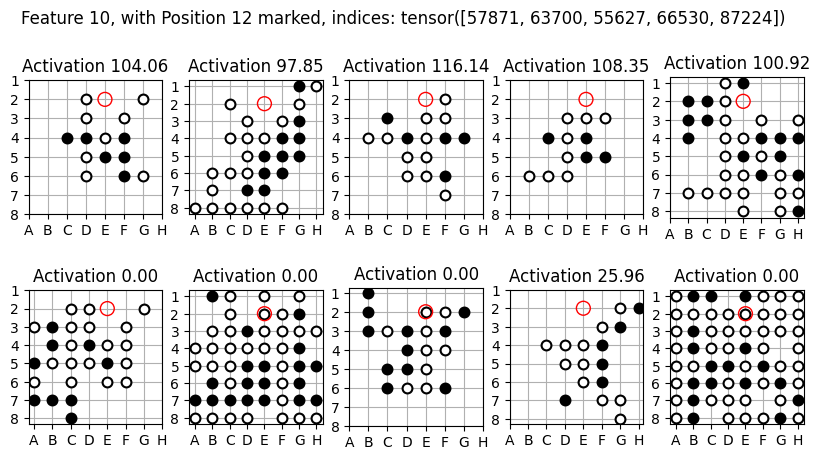

In [68]:
show_top_activating(feature_number=10, top_k=5, top_n=10, marked_position=12)

In [66]:
target_feature = 10
target_pos = 12

In [71]:

plot_distribution_of_activations_legal(target_feature, target_pos)
plot_distribution_of_activations_types(target_feature, target_pos)
plot_distribution_of_activations_empty_legal(target_feature, target_pos, ignore_zero=True)
# plot_distribution_of_activations_empty_legal(353, 18)
# plot_distribution_of_activations_empty_legal(727, 37)
# plot_distribution_of_activations_empty_legal(722, 26)
# plot_distribution_of_activations_odd_even_empty_legal(target_feature, target_pos)
# plot_distribution_of_activations_previous_legal(target_feature, target_pos)
# plot_distribution_of_activations_current_previous_legal(target_feature, target_pos)
# plot_distribution_of_activations_pattern(target_feature, target_pos)
# plot_distribution_of_activations_pattern_legal(target_feature, target_pos, pattern=pattern1, pattern_name="pattern1")

# for pattern_name, pattern in patterns_dict.items():
#     plot_distribution_of_activations_pattern_legal(
#         target_feature, target_pos, pattern=pattern, pattern_name=pattern_name
#     )

# test different patterns
# plot_distribution_of_activations_pattern(target_feature, target_pos, pattern=pattern1)
# plot_distribution_of_activations_pattern(target_feature, target_pos, pattern=pattern2)
# plot_distribution_of_activations_pattern(target_feature, target_pos, pattern=pattern3)
# plot_distribution_of_activations_pattern(target_feature, target_pos, pattern=pattern4)

# plot_distribution_of_activations_patterns(target_feature, target_pos, patterns=[pattern1, pattern2, pattern3, pattern4])